## Import Labaries

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


## Import Dataset 

In [5]:
#import Dataset
reviews = pd.read_csv('../Datasets/1.reviews.csv')

#Show full text in columns
pd.set_option('display.max_colwidth', None)


## EDA AND CLEANING

In [6]:
#Check the first 5 rows of the data 
reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,27934,1094339,2012-04-07,1368195,Michael,"We stayed in the apartment for a week and we enjoyed it very much. Nuttee is a very nice host, and she did her best to accommodate us. Everything is perfect in the apartment, and we love the view from the balcony. The apartment is very modern and spacious, and the location is very central, 10 mins walk to BTS station (and supermarket), or 10 mins by bus/taxi to central world shopping mall. There are also a lot of food stalls and massage nearby. We will definitely stay there again for our next visit to Bangkok. Highly recommended."
1,27934,1241042,2012-05-07,2007324,Scott,"My girlfriend and I recently stayed in Nuttee's condo for a month. It is a beautiful condo, with a great view, in a great location near Victory Monument. There is an abundance of wonderful street food right around the corner, as well as shopping. This is a perfect area from which to base exploration of Bangkok.\r<br/>\r<br/>Nuttee was out of town, but was still very accessible via email. Her assistant, Suchart, was great, meeting us when we arrived, arranging cleaning of the condo, and seeing us off when we left. He did everything possible to make certain our stay was perfect.\r<br/>\r<br/>We could not have asked for a better experience, and hope to stay here again when we return to Bangkok."
2,27934,1523384,2012-06-20,2263352,Marc,"I stayed for one month at the condo and was realy pleased. \r<br/>The condo is at the 19th floor, quiet, modern and clean, and you realy have a ""great city view"" by day and much more by night. The 24 h Security is very friendly and there is a magnetic entrance system. So you feel save.\r<br/>\r<br/>The communication between Nuttee, her assistant and me was perfect and it was no problem to find the building. The assistant of Nuttee was very friendly and explained me everything.\r<br/>\r<br/>There is a good and cheap laundry at Rachaprarob road (4 min walking), 7eleven also and on the way to BTS Victory Monument some nice and cheap restaurants and pubs (Thanon Rang Nam Rd).\r<br/>\r<br/>The location is not direct in the tourist-center of the city but you can see and feel the real Bangkok life as a good starting point to explore the city. Taxi is so cheap that the location is not really important. \r<br/>\r<br/>I would give 9 of 10 points. Recommendable. ;-)\r<br/>...................\r<br/>\r<br/>My special tip: if you like Jazz/Blues live music visit the saxophone pub and restaurant near Victory Monument. Perfect music, great vibe !!!"
3,27934,1655571,2012-07-08,558987,Leyla,"Nuttee was a great host! I really enjoyed her apartment and she was absolutely lovely! She even had a bowl of fresh fruit and a sim card for me when I arrived. \r<br/>The apartment itself is really spacious for a single person or couple and has all the mod cons needed to have a relaxing stay in Bangkok. Great air con and the swimming pool was refreshing after a long humid day walking around!\r<br/>I would recommend the apartment as a great, comfortable and relaxing place to stay in Bangkok for sure. \r<br/>The only thing that you should keep in mind is that the BTS (sky train) is a 10 minute walk away - you can take a motorcycle taxi for a few baht or walking is fine in the mornings. There are nice cafes and food places along the street that you walk down to the BTS so its not that bad unless its the middle of a hot day!!"
4,27934,1972192,2012-08-13,2359865,Rachel,"Nuttee was an amazing host. She and her daughter waited for us at the lobby and gave us a quick rundown of the place. It's a studio apartment, with a classy partition dividing the bedroom from the living room -- and the view from the balcony is awesome. Bed was huge, but if you're coming in a group of 3, the sofa may not always be the most comfortable place for the last guy (bed IS huge enough for three to sleep in though). Shower pressure in the main bathroom was a little low, but we could deal with 

In [7]:
#Check the last 5 rows of the data 
reviews.tail()

,listing_id,id,date,reviewer_id,reviewer_name,comments
342805,972273753617159275,973669063990375155,2023-09-05,398715117,Fond,"We got a whole 4th floor with a very reasonable price! <br/>The room is cozy and look exactly like it is in the photos and it’s a perfect space for three of us. Location is really great as well, surrounded by cool places and local restaurants. You could walk to BTS within 10 mins or call grab car anytime. We followed Fame's guidebook and it was a great experiences! Definitely recommend :)"
342806,972373516391699637,983027874204400766,2023-09-18,519463826,Suttida,"The place is very nice, there’s everything I need. Definitely coming back here next time."
342807,978848471983543233,979454896215151610,2023-09-13,255965147,宇,公寓环境非常好，有配套游泳池、健身房、台球室免费使用。地理位置方便，房间干净整洁。房东非常热情。
342808,972582173604453437,979355021913497032,2023-09-13,513291763,Bak,物超所值，房間很大，附近食物豐盛。
342809,972634231768473303,983057541414905795,2023-09-18,114006785,Chani,"The owner was so active and to pick me up from the airport. The house is a little bit far but secure, if you have car is ok. <br/>Wish to stay longer."


In [8]:
#remove  <br/>\r<br/> from the text in comments column 
reviews['comments'] = reviews['comments'].str.replace('<br/>\r<br/>',' ')
reviews['comments'] = reviews['comments'].str.replace('br',' ') 
reviews['comments'] = reviews['comments'].str.replace('/',' ')
reviews['comments'] = reviews['comments'].str.replace('<',' ')
reviews['comments'] = reviews['comments'].str.replace('>',' ')
reviews['comments'] = reviews['comments'].str.replace('br',' ')
reviews['comments'] = reviews['comments'].str.replace('...................\r',' ')
reviews['comments'] = reviews['comments'].str.replace('............\r',' ')


In [9]:
#Use the info() method to check the data types of the columns 
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 342810 entries, 0 to 342809
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   listing_id     342810 non-null  int64 
 1   id             342810 non-null  int64 
 2   date           342810 non-null  object
 3   reviewer_id    342810 non-null  int64 
 4   reviewer_name  342808 non-null  object
 5   comments       342763 non-null  object
dtypes: int64(3), object(3)
memory usage: 15.7+ MB


In [10]:
#Change the data type of the date column to datetime 
reviews['date'] = pd.to_datetime(reviews['date'])

In [11]:
#Check the data types of the columns again
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 342810 entries, 0 to 342809
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   listing_id     342810 non-null  int64         
 1   id             342810 non-null  int64         
 2   date           342810 non-null  datetime64[ns]
 3   reviewer_id    342810 non-null  int64         
 4   reviewer_name  342808 non-null  object        
 5   comments       342763 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(2)
memory usage: 15.7+ MB


In [12]:
#Use Regex to remove the special characters from the comments column and keep only english letters and numbers 
reviews['comments'] = reviews['comments'].str.replace('[^a-zA-Z0-9 ]', '')

#Use the lower() method to convert the comments column to lowercase
reviews['comments'] = reviews['comments'].str.lower()

#Check the first 5 rows of the data
reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,27934,1094339,2012-04-07,1368195,Michael,"we stayed in the apartment for a week and we enjoyed it very much. nuttee is a very nice host, and she did her best to accommodate us. everything is perfect in the apartment, and we love the view from the balcony. the apartment is very modern and spacious, and the location is very central, 10 mins walk to bts station (and supermarket), or 10 mins by bus taxi to central world shopping mall. there are also a lot of food stalls and massage nearby. we will definitely stay there again for our next visit to bangkok. highly recommended."
1,27934,1241042,2012-05-07,2007324,Scott,"my girlfriend and i recently stayed in nuttee's condo for a month. it is a beautiful condo, with a great view, in a great location near victory monument. there is an abundance of wonderful street food right around the corner, as well as shopping. this is a perfect area from which to base exploration of bangkok.\r nuttee was out of town, but was still very accessible via email. her assistant, suchart, was great, meeting us when we arrived, arranging cleaning of the condo, and seeing us off when we left. he did everything possible to make certain our stay was perfect.\r we could not have asked for a better experience, and hope to stay here again when we return to bangkok."
2,27934,1523384,2012-06-20,2263352,Marc,"i stayed for one month at the condo and was realy pleased. \r the condo is at the 19th floor, quiet, modern and clean, and you realy have a ""great city view"" by day and much more by night. the 24 h security is very friendly and there is a magnetic entrance system. so you feel save.\r the communication between nuttee, her assistant and me was perfect and it was no problem to find the building. the assistant of nuttee was very friendly and explained me everything.\r there is a good and cheap laundry at rachaprarob road (4 min walking), 7eleven also and on the way to bts victory monument some nice and cheap restaurants and pubs (thanon rang nam rd).\r the location is not direct in the tourist-center of the city but you can see and feel the real bangkok life as a good starting point to explore the city. taxi is so cheap that the location is not really important. \r i would give 9 of 10 points. recommendable. ;-)\r my special tip: if you like jazz blues live music visit the saxophone pub and restaurant near victory monument. perfect music, great vibe !!!"
3,27934,1655571,2012-07-08,558987,Leyla,"nuttee was a great host! i really enjoyed her apartment and she was absolutely lovely! she even had a bowl of fresh fruit and a sim card for me when i arrived. \r the apartment itself is really spacious for a single person or couple and has all the mod cons needed to have a relaxing stay in bangkok. great air con and the swimming pool was refreshing after a long humid day walking around!\r i would recommend the apartment as a great, comfortable and relaxing place to stay in bangkok for sure. \r the only thing that you should keep in mind is that the bts (sky train) is a 10 minute walk away - you can take a motorcycle taxi for a few baht or walking is fine in the mornings. there are nice cafes and food places along the street that you walk down to the bts so its not that bad unless its the middle of a hot day!!"
4,27934,1972192,2012-08-13,2359865,Rachel,"nuttee was an amazing host. she and her daughter waited for us at the lobby and gave us a quick rundown of the place. it's a studio apartment, with a classy partition dividing the bedroom from the living room -- and the view from the balcony is awesome. bed was huge, but if you're coming in a group of 3, the sofa may not always be the most comfortable place for the last guy (bed is huge enough for three to sleep in though). shower pressure in the main bathroom was a little low, but we could deal with it. make sure to ask nuttee or her assistant to write down the condominium's address for you in thai, though it will be

In [13]:
#Check columns contain Chinese characters 
#ValueError: Cannot mask with non-boolean array containing NA / NaN values   
reviews[reviews['comments'].str.contains('[\u4e00-\u9fff]+', regex=True, na=False)]

#Drop the rows that contain Chinese characters
reviews = reviews[~reviews['comments'].str.contains('[\u4e00-\u9fff]+', regex=True, na=False)]


In [14]:
#Check columns contain Russian characters
reviews[reviews['comments'].str.contains('[\u0400-\u04FF]+', regex=True, na=False)]
#Drop the rows that contain Russian characters
reviews = reviews[~reviews['comments'].str.contains('[\u0400-\u04FF]+', regex=True, na=False)]
#drop the rows that contain Arabic characters
reviews = reviews[~reviews['comments'].str.contains('[\u0600-\u06FF]+', regex=True, na=False)]
#drop the rows that contain Japanese characters
reviews = reviews[~reviews['comments'].str.contains('[\u3040-\u309F]+', regex=True, na=False)]
#drop the rows that contain Korean characters
reviews = reviews[~reviews['comments'].str.contains('[\u3130-\u318F]+', regex=True, na=False)]
#drop the rows that contain Thai characters
reviews = reviews[~reviews['comments'].str.contains('[\u0E00-\u0E7F]+', regex=True, na=False)]
#drop the rows that contain German characters
reviews = reviews[~reviews['comments'].str.contains('[\u00C0-\u00FF]+', regex=True, na=False)]
#drop the rows that contain Spanish characters
reviews = reviews[~reviews['comments'].str.contains('[\u00C0-\u00FF]+', regex=True, na=False)]
#drop the rows that contain French characters
reviews = reviews[~reviews['comments'].str.contains('[\u00C0-\u00FF]+', regex=True, na=False)]
#drop the rows that contain Italian characters
reviews = reviews[~reviews['comments'].str.contains('[\u00C0-\u00FF]+', regex=True, na=False)]


In [15]:
reviews.shape

(260268, 6)

In [16]:
#Check null values in the data 
reviews.isnull().sum()

#drop null values in the dat
reviews.dropna(inplace=True)

In [17]:
#Check the last 5 rows of the data
reviews.tail()

,listing_id,id,date,reviewer_id,reviewer_name,comments
342800,972238375435056762,982276825475135236,2023-09-17,179564615,Ben,"the pool and facilities were amazing. it was literally a one minute walk to the bts. i could get to the lotus megastore in 3m walk. massage shops and local night market in 3m walk. a starbucks and mini mall with restaurants next door. best place i've stayed in bkk so far. really awesome and the room is in an upscale new complex. thanks for everything, great spot!"
342801,972273753617159275,972900038167471733,2023-09-04,290311599,Miyuki,nice & clean decoration with little touch of colors! we got the whole rooftop floor which is airy and got the cool thai vibes. a room is on 4th floor but it worth the space and price. both beds are comfy and we slept peacefully during our stay. fame also gave us a great local spots on her personal guidebook ! thank you so much & i recommended this place :)
342805,972273753617159275,973669063990375155,2023-09-05,398715117,Fond,"we got a whole 4th floor with a very reasonable price! the room is cozy and look exactly like it is in the photos and it’s a perfect space for three of us. location is really great as well, surrounded by cool places and local restaurants. you could walk to bts within 10 mins or call grab car anytime. we followed fame's guidebook and it was a great experiences! definitely recommend :)"
342806,972373516391699637,983027874204400766,2023-09-18,519463826,Suttida,"the place is very nice, there’s everything i need. definitely coming back here next time."
342809,972634231768473303,983057541414905795,2023-09-18,114006785,Chani,"the owner was so active and to pick me up from the airport. the house is a little bit far but secure, if you have car is ok. wish to stay longer."


In [18]:
reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,27934,1094339,2012-04-07,1368195,Michael,"we stayed in the apartment for a week and we enjoyed it very much. nuttee is a very nice host, and she did her best to accommodate us. everything is perfect in the apartment, and we love the view from the balcony. the apartment is very modern and spacious, and the location is very central, 10 mins walk to bts station (and supermarket), or 10 mins by bus taxi to central world shopping mall. there are also a lot of food stalls and massage nearby. we will definitely stay there again for our next visit to bangkok. highly recommended."
1,27934,1241042,2012-05-07,2007324,Scott,"my girlfriend and i recently stayed in nuttee's condo for a month. it is a beautiful condo, with a great view, in a great location near victory monument. there is an abundance of wonderful street food right around the corner, as well as shopping. this is a perfect area from which to base exploration of bangkok.\r nuttee was out of town, but was still very accessible via email. her assistant, suchart, was great, meeting us when we arrived, arranging cleaning of the condo, and seeing us off when we left. he did everything possible to make certain our stay was perfect.\r we could not have asked for a better experience, and hope to stay here again when we return to bangkok."
2,27934,1523384,2012-06-20,2263352,Marc,"i stayed for one month at the condo and was realy pleased. \r the condo is at the 19th floor, quiet, modern and clean, and you realy have a ""great city view"" by day and much more by night. the 24 h security is very friendly and there is a magnetic entrance system. so you feel save.\r the communication between nuttee, her assistant and me was perfect and it was no problem to find the building. the assistant of nuttee was very friendly and explained me everything.\r there is a good and cheap laundry at rachaprarob road (4 min walking), 7eleven also and on the way to bts victory monument some nice and cheap restaurants and pubs (thanon rang nam rd).\r the location is not direct in the tourist-center of the city but you can see and feel the real bangkok life as a good starting point to explore the city. taxi is so cheap that the location is not really important. \r i would give 9 of 10 points. recommendable. ;-)\r my special tip: if you like jazz blues live music visit the saxophone pub and restaurant near victory monument. perfect music, great vibe !!!"
3,27934,1655571,2012-07-08,558987,Leyla,"nuttee was a great host! i really enjoyed her apartment and she was absolutely lovely! she even had a bowl of fresh fruit and a sim card for me when i arrived. \r the apartment itself is really spacious for a single person or couple and has all the mod cons needed to have a relaxing stay in bangkok. great air con and the swimming pool was refreshing after a long humid day walking around!\r i would recommend the apartment as a great, comfortable and relaxing place to stay in bangkok for sure. \r the only thing that you should keep in mind is that the bts (sky train) is a 10 minute walk away - you can take a motorcycle taxi for a few baht or walking is fine in the mornings. there are nice cafes and food places along the street that you walk down to the bts so its not that bad unless its the middle of a hot day!!"
4,27934,1972192,2012-08-13,2359865,Rachel,"nuttee was an amazing host. she and her daughter waited for us at the lobby and gave us a quick rundown of the place. it's a studio apartment, with a classy partition dividing the bedroom from the living room -- and the view from the balcony is awesome. bed was huge, but if you're coming in a group of 3, the sofa may not always be the most comfortable place for the last guy (bed is huge enough for three to sleep in though). shower pressure in the main bathroom was a little low, but we could deal with it. make sure to ask nuttee or her assistant to write down the condominium's address for you in thai, though it will be

In [19]:
#use English stopwords from nltk library 
from nltk.corpus import stopwords
import nltk

#remove stopwords from column comment
stop = stopwords.words('english')
reviews['comments'] = reviews['comments'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))

#Check the first 5 rows of the data
reviews.head()


,listing_id,id,date,reviewer_id,reviewer_name,comments
0,27934,1094339,2012-04-07,1368195,Michael,"stayed apartment week enjoyed much. nuttee nice host, best accommodate us. everything perfect apartment, love view balcony. apartment modern spacious, location central, 10 mins walk bts station (and supermarket), 10 mins bus taxi central world shopping mall. also lot food stalls massage nearby. definitely stay next visit bangkok. highly recommended."
1,27934,1241042,2012-05-07,2007324,Scott,"girlfriend recently stayed nuttee's condo month. beautiful condo, great view, great location near victory monument. abundance wonderful street food right around corner, well shopping. perfect area base exploration bangkok. nuttee town, still accessible via email. assistant, suchart, great, meeting us arrived, arranging cleaning condo, seeing us left. everything possible make certain stay perfect. could asked better experience, hope stay return bangkok."
2,27934,1523384,2012-06-20,2263352,Marc,"stayed one month condo realy pleased. condo 19th floor, quiet, modern clean, realy ""great city view"" day much night. 24 h security friendly magnetic entrance system. feel save. communication nuttee, assistant perfect problem find building. assistant nuttee friendly explained everything. good cheap laundry rachaprarob road (4 min walking), 7eleven also way bts victory monument nice cheap restaurants pubs (thanon rang nam rd). location direct tourist-center city see feel real bangkok life good starting point explore city. taxi cheap location really important. would give 9 10 points. recommendable. ;-) special tip: like jazz blues live music visit saxophone pub restaurant near victory monument. perfect music, great vibe !!!"
3,27934,1655571,2012-07-08,558987,Leyla,"nuttee great host! really enjoyed apartment absolutely lovely! even bowl fresh fruit sim card arrived. apartment really spacious single person couple mod cons needed relaxing stay bangkok. great air con swimming pool refreshing long humid day walking around! would recommend apartment great, comfortable relaxing place stay bangkok sure. thing keep mind bts (sky train) 10 minute walk away - take motorcycle taxi baht walking fine mornings. nice cafes food places along street walk bts bad unless middle hot day!!"
4,27934,1972192,2012-08-13,2359865,Rachel,"nuttee amazing host. daughter waited us lobby gave us quick rundown place. studio apartment, classy partition dividing bedroom living room -- view balcony awesome. bed huge, coming group 3, sofa may always comfortable place last guy (bed huge enough three sleep though). shower pressure main bathroom little low, could deal it. make sure ask nuttee assistant write condominium's address thai, though best print map -- taxi tuk-tuk motorcycle drivers needed little pointer exactly was. said, central location, slightly away sometimes overwhelming hustle bustle pratunam. warmly recommended."


In [20]:

# Remove words "good" and "great" from the comments column 

replace_word_list = ['good','great','nice','well','really','us','would','also','stay']

for word in replace_word_list:
    reviews['comments'] = reviews['comments'].str.replace(word,'')

reviews['comments'] = reviews['comments'].str.replace('good','')
reviews['comments'] = reviews['comments'].str.replace('great','')
reviews['comments'] = reviews['comments'].str.replace('nice','')
reviews['comments'] = reviews['comments'].str.replace('well','')
reviews['comments'] = reviews['comments'].str.replace('really','')
reviews['comments'] = reviews['comments'].str.replace('us','')
reviews['comments'] = reviews['comments'].str.replace('.','')
reviews['comments'] = reviews['comments'].str.replace('would','')
reviews['comments'] = reviews['comments'].str.replace('also','')
reviews['comments'] = reviews['comments'].str.replace('stay','')
#Check the first 5 rows of the data
reviews.head()


,listing_id,id,date,reviewer_id,reviewer_name,comments
0,27934,1094339,2012-04-07,1368195,Michael,"ed apartment week enjoyed much nuttee host, best accommodate everything perfect apartment, love view balcony apartment modern spacio, location central, 10 mins walk bts station (and supermarket), 10 mins b taxi central world shopping mall lot food stalls massage nearby definitely next visit bangkok highly recommended"
1,27934,1241042,2012-05-07,2007324,Scott,"girlfriend recently ed nuttee's condo month beautiful condo, view, location near victory monument abundance wonderful street food right around corner, shopping perfect area base exploration bangkok nuttee town, still accessible via email assistant, suchart, , meeting arrived, arranging cleaning condo, seeing left everything possible make certain perfect could asked better experience, hope return bangkok"
2,27934,1523384,2012-06-20,2263352,Marc,"ed one month condo realy pleased condo 19th floor, quiet, modern clean, realy "" city view"" day much night 24 h security friendly magnetic entrance system feel save communication nuttee, assistant perfect problem find building assistant nuttee friendly explained everything cheap laundry rachaprarob road (4 min walking), 7eleven way bts victory monument cheap restaurants pubs (thanon rang nam rd) location direct tourist-center city see feel real bangkok life starting point explore city taxi cheap location important give 9 10 points recommendable ;-) special tip: like jazz blues live mic visit saxophone pub restaurant near victory monument perfect mic, vibe !!!"
3,27934,1655571,2012-07-08,558987,Leyla,"nuttee host! enjoyed apartment absolutely lovely! even bowl fresh fruit sim card arrived apartment spacio single person couple mod cons needed relaxing bangkok air con swimming pool refreshing long humid day walking around! recommend apartment , comfortable relaxing place bangkok sure thing keep mind bts (sky train) 10 minute walk away - take motorcycle taxi baht walking fine mornings cafes food places along street walk bts bad unless middle hot day!!"
4,27934,1972192,2012-08-13,2359865,Rachel,"nuttee amazing host daughter waited lobby gave quick rundown place studio apartment, classy partition dividing bedroom living room -- view balcony awesome bed huge, coming group 3, sofa may always comfortable place last guy (bed huge enough three sleep though) shower pressure main bathroom little low, could deal it make sure ask nuttee assistant write condominium's address thai, though best print map -- taxi tuk-tuk motorcycle drivers needed little pointer exactly was said, central location, slightly away sometimes overwhelming htle btle pratunam warmly recommended"


In [21]:
sample_size = 100000

# Sample
reviews = reviews.sample(n=sample_size, random_state=1)
reviews.reset_index(drop=True, inplace=True)
reviews.shape

(100000, 6)

In [22]:
# Number of unique reviewers and listings
num_reviewers = reviews['reviewer_id'].nunique()
num_listings = reviews['listing_id'].nunique()

print(f"Number of Unique Reviewers: {num_reviewers}")
print(f"Number of Unique Listings: {num_listings}")


# Number of reviews per reviewer and listing 

Number of Unique Reviewers: 90242
Number of Unique Listings: 10292


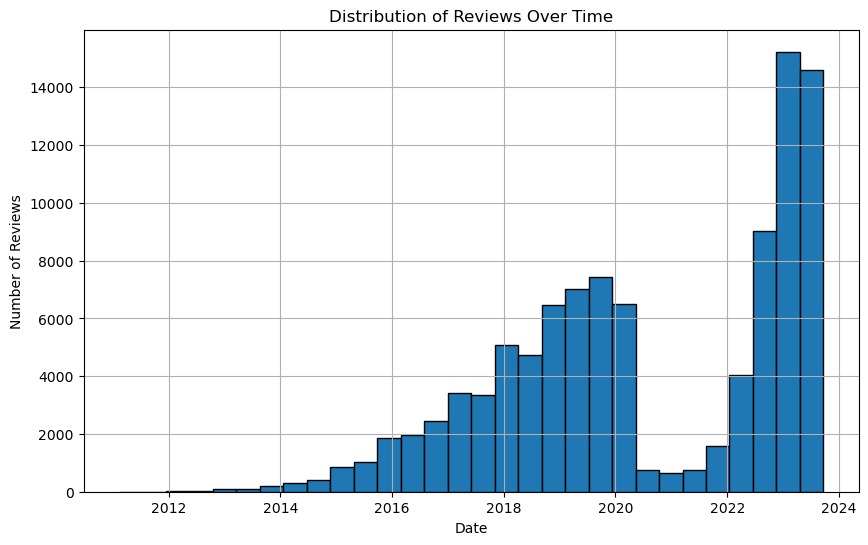

In [23]:

# Explore the distribution of reviews over time
reviews['date'].hist(bins=30, edgecolor='black', figsize=(10, 6))
plt.title('Distribution of Reviews Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Reviews')
plt.show()


#This histogram shows that the number of reviews has increased over time. 
#from 2020 - 2022 Decresed number of reviews because of the pandemic.

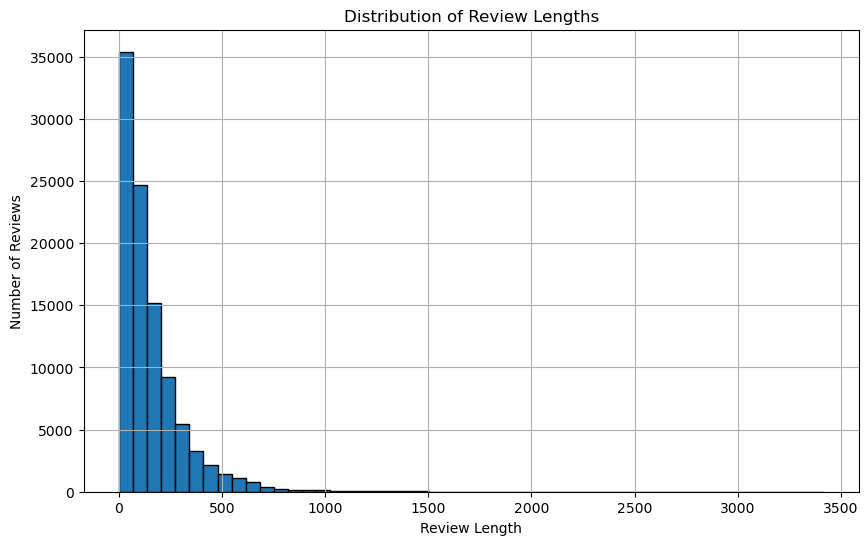

In [24]:
# Create a new column for review length
reviews['review_length'] = reviews['comments'].apply(len)
# Explore the distribution of review lengths
reviews['review_length'].hist(bins=50, edgecolor='black', figsize=(10, 6))
plt.title('Distribution of Review Lengths')
plt.xlabel('Review Length')
plt.ylabel('Number of Reviews')
plt.show()

#This histogram shows that most of the reviews are between 0 and 500 characters long. 

In [25]:
reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments,review_length
0,1943048,22379503,2014-11-04,14064862,Red,"nokiko's apartment perfect ! could find everything need inside (swimming pool, gym, etc) outside (shopping malls, supermarkets) condo mrt bts minutes there flat clean, quiet, located 23h floor view bangkok bed quality, bathroom wi-fi connection thank nokiko, helpful probably see next time bangkok :)",305
1,7826669,589452051,2020-01-06,275798636,Josee,"highly recommend bangkok bed bike bangkok place vibe, lovely unique decor made feel cozy homey got private room comfortable, clean roomy enough me volunteers helpful tips advice hljt genuinely kind location perfect within 10 min walk grand palace, temple emerald buddha, temple reclining buddha giant swing easily grab b taxi right outside hostel downside found ing pretty noisy room main street outside noise diesdown night quite frankly tired full day exploring noise bother i'm light sleeper normally thanks effie volunteersfor !",537
2,43949183,696756032099270993,2022-08-19,404398743,Sebastián,problem whole it’s far downtown me it’s easy ride sky railway,62
3,30486035,763441256716296427,2022-11-19,55974377,Lucas,friendly building manager super convenient location i'll next time i'm bangkok,79
4,11914255,117276698,2016-12-05,80912513,Salma,"amazing small boutique hotel quite, comfy beds, clean simple yet stylish chic best thing hotel service staff helpful kind, willing help u anything noon perfect host make extra effort make u food u love feel home hotel 3 mins walking distance bts station, make super easy u go anywhere i'll definitely ing white ivory whenever go bangkok again",342


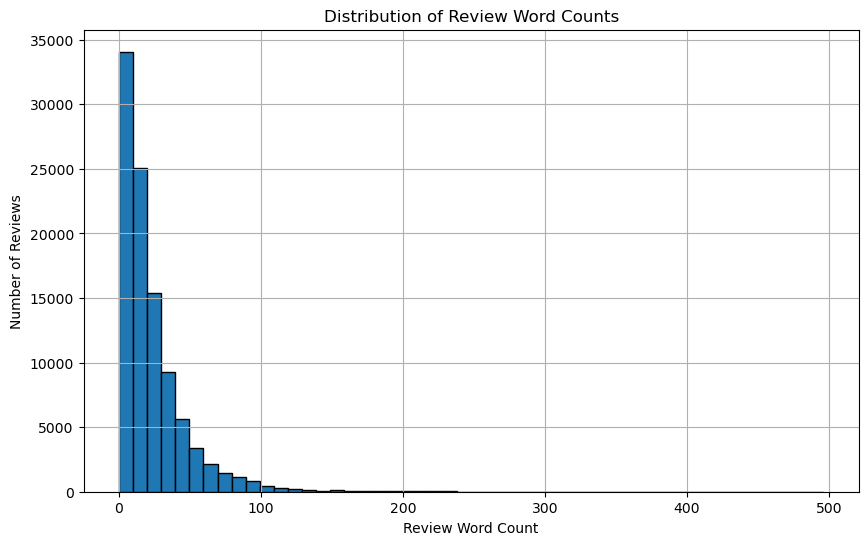

In [26]:
#Create column for number of words in review call review_word_count 
reviews['review_word_count'] = reviews['comments'].apply(lambda x: len(x.split()))

#Check the first 5 rows of the data
reviews.head()

#Visaulize the distribution of review_word_count 
reviews['review_word_count'].hist(bins=50, edgecolor='black', figsize=(10, 6))
plt.title('Distribution of Review Word Counts')
plt.xlabel('Review Word Count')
plt.ylabel('Number of Reviews')
plt.show()

#This histogram shows that most of the reviews are between 0 and 100 words long 

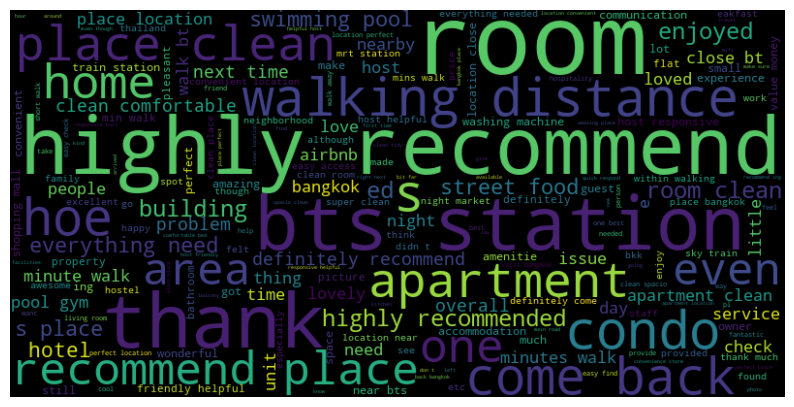

In [27]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Join all reviews into a single text
text = ' '.join(reviews['comments'])

# Generate a word cloud
wordcloud = WordCloud(width=800, height=400, random_state=42, max_font_size=100).generate(text)

# Display the generated word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


In [28]:
#This word cloud show the most common words in the reviews. 
#list top 10 common words in the reviews 
from collections import Counter
Counter(" ".join(reviews["comments"]).split()).most_common(10)

#show the most common words in the reviews in a bar chart
most_common_words = pd.DataFrame(Counter(" ".join(reviews["comments"]).split()).most_common(10))
most_common_words.columns = ['word', 'frequency']

#Descending order
most_common_words.sort_values(by='frequency', ascending=False, inplace=True)
most_common_words.reset_index(drop=True, inplace=True)
most_common_words

,word,frequency
0,place,45874
1,location,23121
2,clean,21923
3,host,21122
4,apartment,21109
5,room,18113
6,bangkok,15863
7,bts,13543
8,everything,13068
9,recommend,12749


/Applications/ANACONDA/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Applications/ANACONDA/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Applications/ANACONDA/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


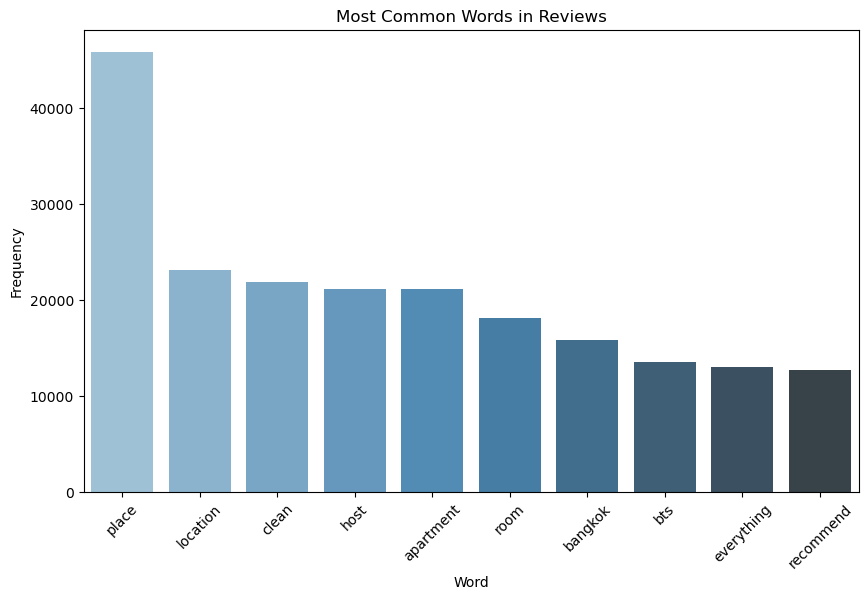

In [29]:
#This word cloud show the most common words in the reviews. 
#list top 10 common words in the reviews 
from collections import Counter
Counter(" ".join(reviews["comments"]).split()).most_common(10)

#show the most common words in the reviews in a bar chart
most_common_words = pd.DataFrame(Counter(" ".join(reviews["comments"]).split()).most_common(10))
most_common_words.columns = ['word', 'frequency']

plt.figure(figsize=(10, 6))
sns.barplot(x='word', y='frequency', data=most_common_words, palette='Blues_d')
plt.title('Most Common Words in Reviews')
plt.xlabel('Word')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()


In [30]:
from textblob import TextBlob

# Create a function to get sentiment
def get_sentiment(text):
    analysis = TextBlob(text)
    return analysis.sentiment.polarity

# Apply the function to create a new column
reviews['sentiment'] = reviews['comments'].apply(get_sentiment)

# Check the first 5 rows of the data
reviews.head()


#This result shows that the sentiment of the reviews is mostly positive and compare with positive words in the reviews and negative words in the reviews.

,listing_id,id,date,reviewer_id,reviewer_name,comments,review_length,review_word_count,sentiment
0,1943048,22379503,2014-11-04,14064862,Red,"nokiko's apartment perfect ! could find everything need inside (swimming pool, gym, etc) outside (shopping malls, supermarkets) condo mrt bts minutes there flat clean, quiet, located 23h floor view bangkok bed quality, bathroom wi-fi connection thank nokiko, helpful probably see next time bangkok :)",305,44,0.263095
1,7826669,589452051,2020-01-06,275798636,Josee,"highly recommend bangkok bed bike bangkok place vibe, lovely unique decor made feel cozy homey got private room comfortable, clean roomy enough me volunteers helpful tips advice hljt genuinely kind location perfect within 10 min walk grand palace, temple emerald buddha, temple reclining buddha giant swing easily grab b taxi right outside hostel downside found ing pretty noisy room main street outside noise diesdown night quite frankly tired full day exploring noise bother i'm light sleeper normally thanks effie volunteersfor !",537,81,0.247154
2,43949183,696756032099270993,2022-08-19,404398743,Sebastián,problem whole it’s far downtown me it’s easy ride sky railway,62,11,0.244444
3,30486035,763441256716296427,2022-11-19,55974377,Lucas,friendly building manager super convenient location i'll next time i'm bangkok,79,11,0.236111
4,11914255,117276698,2016-12-05,80912513,Salma,"amazing small boutique hotel quite, comfy beds, clean simple yet stylish chic best thing hotel service staff helpful kind, willing help u anything noon perfect host make extra effort make u food u love feel home hotel 3 mins walking distance bts station, make super easy u go anywhere i'll definitely ing white ivory whenever go bangkok again",342,58,0.355556


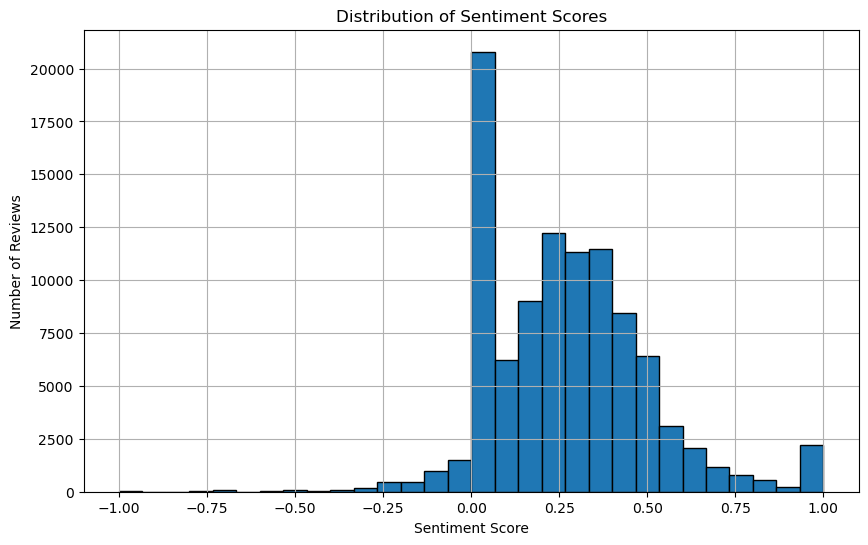

In [31]:
# Explore the distribution of sentiment scores
reviews['sentiment'].hist(bins=30, edgecolor='black', figsize=(10, 6))
plt.title('Distribution of Sentiment Scores')
plt.xlabel('Sentiment Score')
plt.ylabel('Number of Reviews')
plt.show()

In [32]:
#Check most positive reviews 
reviews[reviews['sentiment'] == 1]['comments'].head(20)


45                                                                                                                                                                       best hotel bangkok!
51                                                                                                                                                                                   perfect
142                    dennis communication highest level send information know get place place perfect ing days he's talk giving information wanna know city trip thank hospitality dennis!
163                                                                                                                                                                         wonderful place!
189                                                                                                           walking distance asoke shopping area, transport, magnificent park i’ll  again!
329                                                    

In [33]:
#Find the most positive top 5 and negative reviews top 5 and show 

# Find the most positive reviews
most_positive = reviews.sort_values('sentiment', ascending=False)
most_positive.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments,review_length,review_word_count,sentiment
72626,893373525609391955,962714201905372801,2023-08-21,86227980,Mathubalan,one best host ive ever time ing airbnb,38,8,1.0
26751,38077755,605639187,2020-02-15,279107440,Ellie,perfect!!,9,1,1.0
91246,21939571,335028786,2018-10-11,172272424,Sylvie,always wonderful,16,2,1.0
54946,43346674,935953127378955507,2023-07-15,144755681,Pieter,"perfect, time again tnx",23,4,1.0
97372,744699230570268146,804697789273734109,2023-01-15,247656824,Philipp,"ed nights perfect needs go bangkok again, book apartment again",63,10,1.0


In [34]:
# Find the most negative reviews
most_negative = reviews.sort_values('sentiment', ascending=True)
most_negative.head()



,listing_id,id,date,reviewer_id,reviewer_name,comments,review_length,review_word_count,sentiment
48023,31025787,422629546109644132,2021-08-05,305004614,Roxanne Joy,cleanliness terrible!,21,2,-1.0
21177,21048258,836514110817928643,2023-02-27,103336499,Duane,"internet work, tv work, microwave unsafe, numero items worst experience ever lynn fix anything noisy place night",112,17,-1.0
26771,52874721,973575946182518129,2023-09-05,531467182,Adam,"value money, roof garden, gym swimming pool, room, close wong sawang metro station downside: neighbourhood boring",116,16,-1.0
77064,703267812173367296,904771452565440808,2023-06-02,59528352,Tom,worst place ever,16,3,-1.0
93668,32321691,861952437347127731,2023-04-04,155161077,Shuhei,horrible,8,1,-1.0


In [35]:
import plotly.express as px

# Create an interactive dashboard
fig = px.scatter(reviews, x='date', y='sentiment', color='sentiment', size='review_length')
fig.update_layout(title='Interactive Dashboard of Reviews', xaxis_title='Date', yaxis_title='Sentiment')
#plt.plot((2012,0),(2024,0), color='red', linewidth=2)

fig.show()

#This interactive dashboard shows the sentiment of reviews over time. 


/Applications/ANACONDA/anaconda3/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


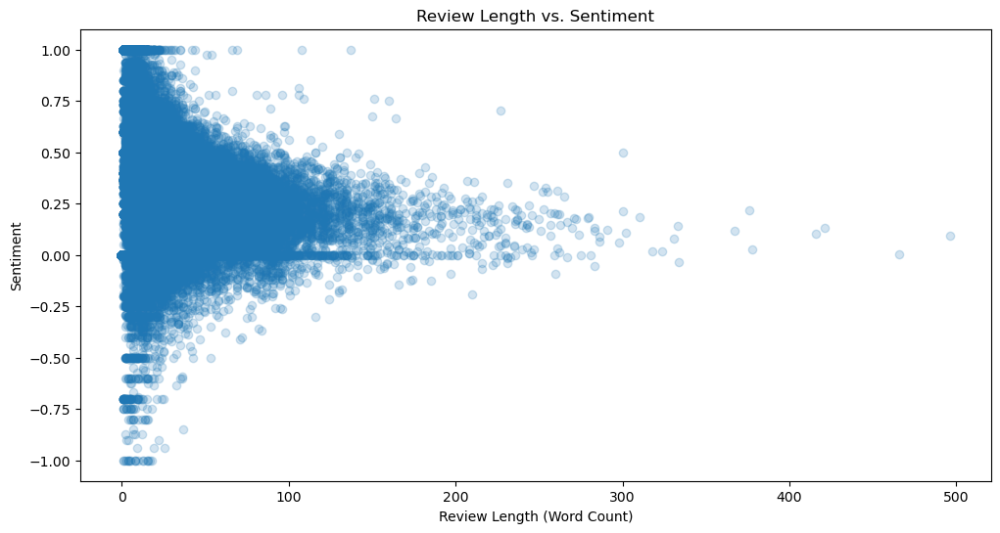

In [36]:
# Plot review length vs. sentiment
plt.figure(figsize=(12, 6))
plt.scatter(reviews['review_word_count'], reviews['sentiment'], alpha=0.2)
plt.title('Review Length vs. Sentiment')
plt.xlabel('Review Length (Word Count)')
plt.ylabel('Sentiment')
plt.show()


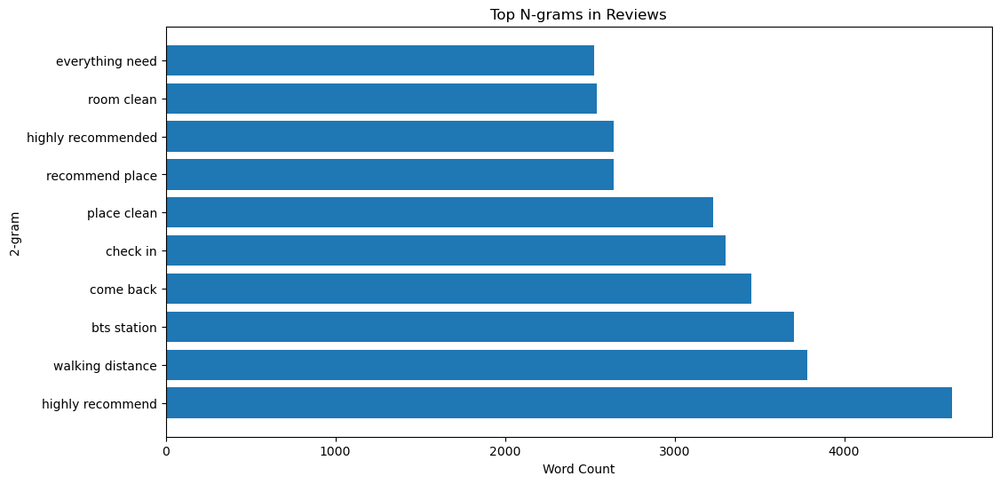

<Figure size 640x480 with 0 Axes>

In [37]:
from sklearn.feature_extraction.text import CountVectorizer

# Create a bag-of-words model
vectorizer = CountVectorizer(ngram_range=(2, 2))
X = vectorizer.fit_transform(reviews['comments'])

# Get feature names
feature_names = vectorizer.get_feature_names_out()

# Sum the counts of each feature
ngram_counts = X.sum(axis=0).A1

# Create a DataFrame of top N-grams
top_ngrams = pd.DataFrame({'N-gram': feature_names, 'Count': ngram_counts})
top_ngrams = top_ngrams.sort_values(by='Count', ascending=False).head(10)

# Plot the top N-grams
plt.figure(figsize=(12, 6))
plt.barh(top_ngrams['N-gram'], top_ngrams['Count'])
plt.title('Top N-grams in Reviews')
plt.xlabel('Word Count')
plt.ylabel('2-gram')
plt.show()

#Find most Bi-gram words in the reviews

#save the pictured 
plt.savefig('2.top_bigram_words.png')

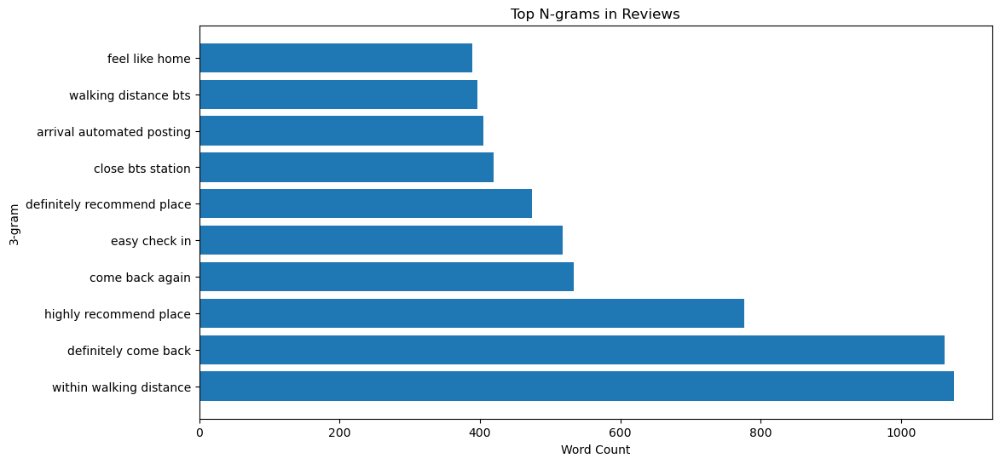

<Figure size 640x480 with 0 Axes>

In [38]:
from sklearn.feature_extraction.text import CountVectorizer

# Create a bag-of-words model
vectorizer = CountVectorizer(ngram_range=(3, 3))
X = vectorizer.fit_transform(reviews['comments'])

# Get feature names
feature_names = vectorizer.get_feature_names_out()

# Sum the counts of each feature
ngram_counts = X.sum(axis=0).A1

# Create a DataFrame of top N-grams
top_ngrams = pd.DataFrame({'N-gram': feature_names, 'Count': ngram_counts})
top_ngrams = top_ngrams.sort_values(by='Count', ascending=False).head(10)

# Plot the top N-grams
plt.figure(figsize=(12, 6))
plt.barh(top_ngrams['N-gram'], top_ngrams['Count'])
plt.title('Top N-grams in Reviews')
plt.xlabel('Word Count')
plt.ylabel('3-gram')
plt.show()

#Find most Tri-gram words in the reviews
#save the pictured 
plt.savefig('3.top_trigram_words.png')



In [39]:
import sys
# !{sys.executable} -m spacy download en
import re, numpy as np, pandas as pd
from pprint import pprint

# Gensim
import gensim, spacy, logging, warnings
import gensim.corpora as corpora
#from gensim.utils import lemmatize, simple_preprocess
from gensim.utils import  simple_preprocess
from gensim.models import CoherenceModel
import matplotlib.pyplot as plt

## TOPIC MODELING

In [40]:
# Build the bigram and trigram models 

bigram = gensim.models.Phrases(reviews['comments'], min_count=5, threshold=100) # higher threshold fewer phrases. 
trigram = gensim.models.Phrases(bigram[reviews['comments']], threshold=100) 
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

import spacy
from spacy.lang.en import English

def process_words(texts, stop_words=stop, allowed_tags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """Remove Stopwords, Form Bigrams, Trigrams and Lemmatization"""
    texts = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]
    texts = [bigram_mod[doc] for doc in texts]
    texts = [trigram_mod[bigram_mod[doc]] for doc in texts]
    texts_out = []
    nlp = spacy.load("en_core_web_sm", disable=['parser', 'ner'])

    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_tags])
    # remove stopwords once more after lemmatization
    texts_out = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts_out]    
    texts_out = [[word for word in doc if len(word) > 3] for doc in texts_out]
    return texts_out 

# Process reviews

data_words = process_words(reviews['comments'])  # processed Text Data!



In [41]:
len(data_words)

100000

In [42]:
# Create Dictionary
id2word = corpora.Dictionary(data_words)

# Create Corpus: Term Document Frequency
corpus = [id2word.doc2bow(text) for text in data_words]

# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=4, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=10,
                                           passes=10,
                                           alpha='symmetric',
                                           iterations=100,
                                           per_word_topics=True)

pprint(lda_model.print_topics())

[(0,
  '0.043*"room" + 0.038*"close" + 0.031*"pool" + 0.026*"convenient" + '
  '0.023*"much" + 0.020*"work" + 0.016*"building" + 0.015*"condo" + '
  '0.015*"water" + 0.012*"kitchen"'),
 (1,
  '0.119*"place" + 0.045*"clean" + 0.044*"recommend" + 0.041*"location" + '
  '0.030*"host" + 0.027*"helpful" + 0.023*"room" + 0.021*"definitely" + '
  '0.020*"perfect" + 0.020*"comfortable"'),
 (2,
  '0.042*"apartment" + 0.029*"walk" + 0.019*"time" + 0.019*"location" + '
  '0.019*"need" + 0.018*"area" + 0.018*"station" + 0.017*"thank" + '
  '0.016*"food" + 0.014*"easy"'),
 (3,
  '0.061*"host" + 0.052*"check" + 0.029*"friendly" + 0.026*"responsive" + '
  '0.022*"experience" + 0.022*"provide" + 0.021*"give" + 0.019*"even" + '
  '0.016*"always" + 0.016*"book"')]


In [43]:
def format_topics_sentences(ldamodel=None, corpus=corpus, texts=reviews['comments']):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                #sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
                #print(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]))
                sent_topics_df = pd.concat([sent_topics_df, pd.DataFrame([int(topic_num),round(prop_topic,4), topic_keywords]).T], ignore_index=True)
            else:
                break
            #print(sent_topics_df.head())
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']
    #sent_topics_df.columns = ['Topic_Keywords']
    #print(sent_topics_df.head())
    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data_words)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,2,0.7657,"apartment, walk, time, location, need, area, station, thank, food, easy","[nokiko, apartment, perfect, find, need, swimming, pool, shopping, mall, minute, flat, clean, quiet, locate, floor, view, quality, bathroom, connection, thank, nokiko, helpful, probably, next, time]"
1,1,2,0.4309,"apartment, walk, time, location, need, area, station, thank, food, easy","[highly, recommend, vibe, lovely, unique, decor, make, feel, cozy, homey, private, room, comfortable, clean, roomy, enough, volunteer, helpful, advice, hljt, genuinely, kind, location, perfect, walk, grand, recline, buddha, giant, swing, easily, grab, taxi, right, downside, find, pretty, noisy, room, main, street, noise, night, quite, frankly, tired, full, explore, noise, bother, sleeper, normally, thank, effie]"
2,2,2,0.7397,"apartment, walk, time, location, need, area, station, thank, food, easy","[problem, whole, downtown, easy, ride, railway]"
3,3,0,0.4062,"room, close, pool, convenient, much, work, building, condo, water, kitchen","[friendly, building, manager, convenient, location, next, time]"
4,4,1,0.5155,"place, clean, recommend, location, host, helpful, room, definitely, perfect, comfortable","[amazing, small, boutique, hotel, quite, comfy, clean, simple, stylish, chic, good, thing, hotel, service, staff, helpful, kind, willing, help, noon, perfect, host, make, extra, effort, make, food, love, feel, home, hotel, walk, distance, station, make, super, easy, anywhere, definitely, white, ivory]"
5,5,3,0.3614,"host, check, friendly, responsive, experience, provide, give, even, always, book","[place, people, location, perfect, people, friendly, laundromat, build]"
6,6,0,0.7803,"room, close, pool, convenient, much, work, building, condo, water, kitchen","[location, apartment, close, convenient, travel, equip, swimming, pool, much, hygiene, room, clean, daylighte, equipment, relatively, complete, relatively, speak, high, cost, performance, quite, satisfied]"
7,7,1,0.5385,"place, clean, recommend, location, host, helpful, room, definitely, perfect, comfortable","[clean, modern, jing, host, highly, recommend, want, modern]"
8,8,2,0.8256,"apartment, walk, time, location, need, area, station, thank, food, easy","[enjoy, come, back, night, chill, sofa, watch, location, walkable, walk, feel, shopping, whole, however, always, motor, available, happen, host, leave, clear, instruction, check, overall]"
9,9,1,0.8929,"place, clean, recommend, location, host, helpful, room, definitely, perfect, comfortable","[amazing, place, price, recommend, well, honestly]"


In [44]:
def format_all_topics_sentences(ldamodel=None, corpus=corpus, texts=reviews['comments']):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get topic distribution for each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list
        row = sorted(row, key=lambda x: (x[1]), reverse=True)

        # Store topic distribution
        topic_distribution = {}
        for topic_num, prop_topic in row:
            topic_distribution[f"Topic_{topic_num}"] = round(prop_topic, 4)

        sent_topics_df = pd.concat([sent_topics_df, pd.DataFrame(topic_distribution, index=[i])], ignore_index=True)

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return sent_topics_df

# Example usage
df_topic_sents_distribution = format_all_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data_words)

# Format and Display
df_topic_sents_distribution = df_topic_sents_distribution.reset_index()
df_topic_sents_distribution.columns = ['Document_No'] + [f'Topic_{i}_Perc_Contrib' for i in range(lda_model.num_topics)] + ['Text']
df_topic_sents_distribution.head(10)


,Document_No,Topic_0_Perc_Contrib,Topic_1_Perc_Contrib,Topic_2_Perc_Contrib,Topic_3_Perc_Contrib,Text
0,0,0.7657,0.1272,0.0974,NaN,"[nokiko, apartment, perfect, find, need, swimming, pool, shopping, mall, minute, flat, clean, quiet, locate, floor, view, quality, bathroom, connection, thank, nokiko, helpful, probably, next, time]"
1,1,0.4309,0.1618,0.4012,NaN,"[highly, recommend, vibe, lovely, unique, decor, make, feel, cozy, homey, private, room, comfortable, clean, roomy, enough, volunteer, helpful, advice, hljt, genuinely, kind, location, perfect, walk, grand, recline, buddha, giant, swing, easily, grab, taxi, right, downside, find, pretty, noisy, room, main, street, noise, night, quite, frankly, tired, full, explore, noise, bother, sleeper, normally, thank, effie]"
2,2,0.7397,0.0357,0.1885,0.0361,"[problem, whole, downtown, easy, ride, railway]"
3,3,0.4045,0.4062,0.0331,0.1563,"[friendly, building, manager, convenient, location, next, time]"
4,4,0.3212,0.0901,0.5155,0.0731,"[amazing, small, boutique, hotel, quite, comfy, clean, simple, stylish, chic, good, thing, hotel, service, staff, helpful, kind, willing, help, noon, perfect, host, make, extra, effort, make, food, love, feel, home, hotel, walk, distance, station, make, super, easy, anywhere, definitely, white, ivory]"
5,5,0.1470,0.1449,0.3467,0.3614,"[place, people, location, perfect, people, friendly, laundromat, build]"
6,6,0.1974,0.7803,0.0115,0.0108,"[location, apartment, close, convenient, travel, equip, swimming, pool, much, hygiene, room, clean, daylighte, equipment, relatively, complete, relatively, speak, high, cost, performance, quite, satisfied]"
7,7,0.4035,0.0278,0.5386,0.0301,"[clean, modern, jing, host, highly, recommend, want, modern]"
8,8,0.8256,0.0498,0.0105,0.1141,"[enjoy, come, back, night, chill, sofa, watch, location, walkable, walk, feel, shopping, whole, however, always, motor, available, happen, host, leave, clear, instruction, check, overall]"
9,9,0.0357,0.0357,0.8929,0.0357,"[amazing, place, price, recommend, well, honestly]"


In [45]:
# pit column Topic_0_Perc_Contrib, Topic_1_Perc_Contrib , Topic_2_Perc_Contrib , Topic_3_Perc_Contrib in reviews dataframe
reviews = pd.concat([reviews, df_topic_sents_distribution], axis=1)

#Check the first 5 rows of the data
reviews.head()

#drop text column from reviews dataframe
reviews.drop(columns=['Text'], inplace=True)




In [46]:
df_topic_sents_distribution.columns

Index(['Document_No', 'Topic_0_Perc_Contrib', 'Topic_1_Perc_Contrib',
       'Topic_2_Perc_Contrib', 'Topic_3_Perc_Contrib', 'Text'],
      dtype='object')

In [47]:
df_topic_sents_distribution.loc[0][['Topic_0_Perc_Contrib', 'Topic_1_Perc_Contrib','Topic_2_Perc_Contrib', 'Topic_3_Perc_Contrib']].sort_values(ascending=False).head(2)

Topic_0_Perc_Contrib    0.7657
Topic_1_Perc_Contrib    0.1272
Name: 0, dtype: object

In [48]:
def format_all_topics_sentences(ldamodel, corpus, texts):
    sent_topics_df = pd.DataFrame()

    # Get all topics in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        
        # List to store topics and contributions for the current document
        topics_contributions = []

        # Iterating through all topics
        for topic_num, prop_topic in row:
            wp = ldamodel.show_topic(topic_num)
            topic_keywords = ", ".join([word for word, prop in wp])
            topics_contributions.append((int(topic_num), round(prop_topic, 4), topic_keywords))

        # Append to the dataframe
        sent_topics_df = pd.concat([sent_topics_df, pd.DataFrame(topics_contributions, 
                                     columns=['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']).assign(Document_No=i)], 
                                     ignore_index=True)

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents.rename('Text')], axis=1)
    return(sent_topics_df)

# Example usage
df_all_topics = format_all_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=reviews['comments'])
df_all_topics.head()


,Dominant_Topic,Perc_Contribution,Topic_Keywords,Document_No,Text
0,2,0.7657,"apartment, walk, time, location, need, area, station, thank, food, easy",0,"nokiko's apartment perfect ! could find everything need inside (swimming pool, gym, etc) outside (shopping malls, supermarkets) condo mrt bts minutes there flat clean, quiet, located 23h floor view bangkok bed quality, bathroom wi-fi connection thank nokiko, helpful probably see next time bangkok :)"
1,0,0.1272,"room, close, pool, convenient, much, work, building, condo, water, kitchen",0,"highly recommend bangkok bed bike bangkok place vibe, lovely unique decor made feel cozy homey got private room comfortable, clean roomy enough me volunteers helpful tips advice hljt genuinely kind location perfect within 10 min walk grand palace, temple emerald buddha, temple reclining buddha giant swing easily grab b taxi right outside hostel downside found ing pretty noisy room main street outside noise diesdown night quite frankly tired full day exploring noise bother i'm light sleeper normally thanks effie volunteersfor !"
2,1,0.0974,"place, clean, recommend, location, host, helpful, room, definitely, perfect, comfortable",0,problem whole it’s far downtown me it’s easy ride sky railway
3,2,0.4309,"apartment, walk, time, location, need, area, station, thank, food, easy",1,friendly building manager super convenient location i'll next time i'm bangkok
4,1,0.4012,"place, clean, recommend, location, host, helpful, room, definitely, perfect, comfortable",1,"amazing small boutique hotel quite, comfy beds, clean simple yet stylish chic best thing hotel service staff helpful kind, willing help u anything noon perfect host make extra effort make u food u love feel home hotel 3 mins walking distance bts station, make super easy u go anywhere i'll definitely ing white ivory whenever go bangkok again"


In [49]:
df_dominant_topic.shape

(100000, 5)

In [50]:
#Show Dominant_Topic = 0 5 rows 
df_dominant_topic[df_dominant_topic['Dominant_Topic'] == 0].head()


,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
3,3,0,0.4062,"room, close, pool, convenient, much, work, building, condo, water, kitchen","[friendly, building, manager, convenient, location, next, time]"
6,6,0,0.7803,"room, close, pool, convenient, much, work, building, condo, water, kitchen","[location, apartment, close, convenient, travel, equip, swimming, pool, much, hygiene, room, clean, daylighte, equipment, relatively, complete, relatively, speak, high, cost, performance, quite, satisfied]"
16,16,0,0.75,"room, close, pool, convenient, much, work, building, condo, water, kitchen","[cheap, close]"
19,19,0,0.625,"room, close, pool, convenient, much, work, building, condo, water, kitchen",[star]
20,20,0,0.8498,"room, close, pool, convenient, much, work, building, condo, water, kitchen","[free, cloth, wash, machine]"


In [51]:
#show Dominant_Topic = 1 
df_dominant_topic[df_dominant_topic['Dominant_Topic'] == 1].head()


,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
4,4,1,0.5155,"place, clean, recommend, location, host, helpful, room, definitely, perfect, comfortable","[amazing, small, boutique, hotel, quite, comfy, clean, simple, stylish, chic, good, thing, hotel, service, staff, helpful, kind, willing, help, noon, perfect, host, make, extra, effort, make, food, love, feel, home, hotel, walk, distance, station, make, super, easy, anywhere, definitely, white, ivory]"
7,7,1,0.5385,"place, clean, recommend, location, host, helpful, room, definitely, perfect, comfortable","[clean, modern, jing, host, highly, recommend, want, modern]"
9,9,1,0.8929,"place, clean, recommend, location, host, helpful, room, definitely, perfect, comfortable","[amazing, place, price, recommend, well, honestly]"
10,10,1,0.8072,"place, clean, recommend, location, host, helpful, room, definitely, perfect, comfortable","[room, perfect, lonly, traveller, host, kind, welcome, definetely, recommend]"
11,11,1,0.8736,"place, clean, recommend, location, host, helpful, room, definitely, perfect, comfortable","[lovely, host, amazing, location, place]"


In [52]:
#show Dominant_Topic = 2 
df_dominant_topic[df_dominant_topic['Dominant_Topic'] == 2].head()


,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,2,0.7657,"apartment, walk, time, location, need, area, station, thank, food, easy","[nokiko, apartment, perfect, find, need, swimming, pool, shopping, mall, minute, flat, clean, quiet, locate, floor, view, quality, bathroom, connection, thank, nokiko, helpful, probably, next, time]"
1,1,2,0.4309,"apartment, walk, time, location, need, area, station, thank, food, easy","[highly, recommend, vibe, lovely, unique, decor, make, feel, cozy, homey, private, room, comfortable, clean, roomy, enough, volunteer, helpful, advice, hljt, genuinely, kind, location, perfect, walk, grand, recline, buddha, giant, swing, easily, grab, taxi, right, downside, find, pretty, noisy, room, main, street, noise, night, quite, frankly, tired, full, explore, noise, bother, sleeper, normally, thank, effie]"
2,2,2,0.7397,"apartment, walk, time, location, need, area, station, thank, food, easy","[problem, whole, downtown, easy, ride, railway]"
8,8,2,0.8256,"apartment, walk, time, location, need, area, station, thank, food, easy","[enjoy, come, back, night, chill, sofa, watch, location, walkable, walk, feel, shopping, whole, however, always, motor, available, happen, host, leave, clear, instruction, check, overall]"
21,21,2,0.4451,"apartment, walk, time, location, need, area, station, thank, food, easy","[place, spend, time, location, correct, somewhere, sanam, station, walk, station, building, clean, cozy, staff, friendly, common, space, studio, photo, room, watch, friend, complaint, noise, hear, place, station, food, time]"


In [53]:
#show Dominant_Topic = 3 
df_dominant_topic[df_dominant_topic['Dominant_Topic'] == 3].head()


,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
5,5,3,0.3614,"host, check, friendly, responsive, experience, provide, give, even, always, book","[place, people, location, perfect, people, friendly, laundromat, build]"
12,12,3,0.3126,"host, check, friendly, responsive, experience, provide, give, even, always, book","[amenity, furnish, place]"
15,15,3,0.6573,"host, check, friendly, responsive, experience, provide, give, even, always, book","[airbnb, location, host, accommodate, responsive, pool, fitness, center, check, check, process, straight, forward, overall, experience, book]"
23,23,3,0.8927,"host, check, friendly, responsive, experience, provide, give, even, always, book","[host, cancel, reservation, arrival, automate, posting]"
38,38,3,0.4214,"host, check, friendly, responsive, experience, provide, give, even, always, book","[apartment, exactly, expect, description, clean, host, give, information, need, easy, flexible, check]"


In [54]:
#put Keywords and Dominant_Topic in the reviews dataframe
#reviews['Keywords'] = df_dominant_topic['Keywords']
#reviews['Dominant_Topic'] = df_dominant_topic['Dominant_Topic']
reviews["Topic_Perc_Contrib"] = df_dominant_topic["Topic_Perc_Contrib"]
reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments,review_length,review_word_count,sentiment,Document_No,Topic_0_Perc_Contrib,Topic_1_Perc_Contrib,Topic_2_Perc_Contrib,Topic_3_Perc_Contrib,Topic_Perc_Contrib
0,1943048,22379503,2014-11-04,14064862,Red,"nokiko's apartment perfect ! could find everything need inside (swimming pool, gym, etc) outside (shopping malls, supermarkets) condo mrt bts minutes there flat clean, quiet, located 23h floor view bangkok bed quality, bathroom wi-fi connection thank nokiko, helpful probably see next time bangkok :)",305,44,0.263095,0,0.7657,0.1272,0.0974,NaN,0.7657
1,7826669,589452051,2020-01-06,275798636,Josee,"highly recommend bangkok bed bike bangkok place vibe, lovely unique decor made feel cozy homey got private room comfortable, clean roomy enough me volunteers helpful tips advice hljt genuinely kind location perfect within 10 min walk grand palace, temple emerald buddha, temple reclining buddha giant swing easily grab b taxi right outside hostel downside found ing pretty noisy room main street outside noise diesdown night quite frankly tired full day exploring noise bother i'm light sleeper normally thanks effie volunteersfor !",537,81,0.247154,1,0.4309,0.1618,0.4012,NaN,0.4309
2,43949183,696756032099270993,2022-08-19,404398743,Sebastián,problem whole it’s far downtown me it’s easy ride sky railway,62,11,0.244444,2,0.7397,0.0357,0.1885,0.0361,0.7397
3,30486035,763441256716296427,2022-11-19,55974377,Lucas,friendly building manager super convenient location i'll next time i'm bangkok,79,11,0.236111,3,0.4045,0.4062,0.0331,0.1563,0.4062
4,11914255,117276698,2016-12-05,80912513,Salma,"amazing small boutique hotel quite, comfy beds, clean simple yet stylish chic best thing hotel service staff helpful kind, willing help u anything noon perfect host make extra effort make u food u love feel home hotel 3 mins walking distance bts station, make super easy u go anywhere i'll definitely ing white ivory whenever go bangkok again",342,58,0.355556,4,0.3212,0.0901,0.5155,0.0731,0.5155


In [55]:
df_dominant_topic.shape

(100000, 5)

In [56]:
df_dominant_topic['Dominant_Topic'].value_counts(normalize=True)

Dominant_Topic
2    0.38229
1    0.36061
0    0.15301
3    0.10409
Name: proportion, dtype: float64

In [57]:
# Display setting to show more characters in column
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_mallet = pd.DataFrame()
sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]

# Show


#i want to show full text in column Representative Text
pd.set_option('display.max_colwidth', None)

sent_topics_sorteddf_mallet.head(10)



,Topic_Num,Topic_Perc_Contrib,Keywords,Representative Text
0,0,0.9725,"room, close, pool, convenient, much, work, building, condo, water, kitchen","[훌륭하고, 지내기에, 좋습니다, 있습니다, 훌륭해서, 이곳저곳, 여행하기, 좋았습니다, 호스트는, 전문적으로, 바퀴벌레가, 대응해주었으며, 이후에는, 한달이상, 만족스러웠습니다, 기본적인, 바디워시, 같습니다, 마지막으로, 도착하는, 확인하시기, 바랍니다, 전기요금의, 에어컨을, 추가요금이, 있습니다, 바랍니다]"
1,1,0.9553,"place, clean, recommend, location, host, helpful, room, definitely, perfect, comfortable","[love, room, value, host, room, clean, spacio, love, beautiful, decoration, make, feel, home, location, highly, recommend]"
2,2,0.9651,"apartment, walk, time, location, need, area, station, thank, food, easy","[clean, conveniently, locate, apartment, gate, locate, metre, exit, right, next, pharmacy, opening, shortly, upmarket, supermarket, meter, coffee, shop, wonderful, view, apartment]"
3,3,0.951,"host, check, friendly, responsive, experience, provide, give, even, always, book","[schoonmaakster, minuten, minuten, straat, moeten, wachten, meet, lagen, heel, vooral, vanaf, zwembad, sportschool, verdiepe, zijn, waanzinnig, dame, haar, deze, alleen, voor, vanaf, reageert]"


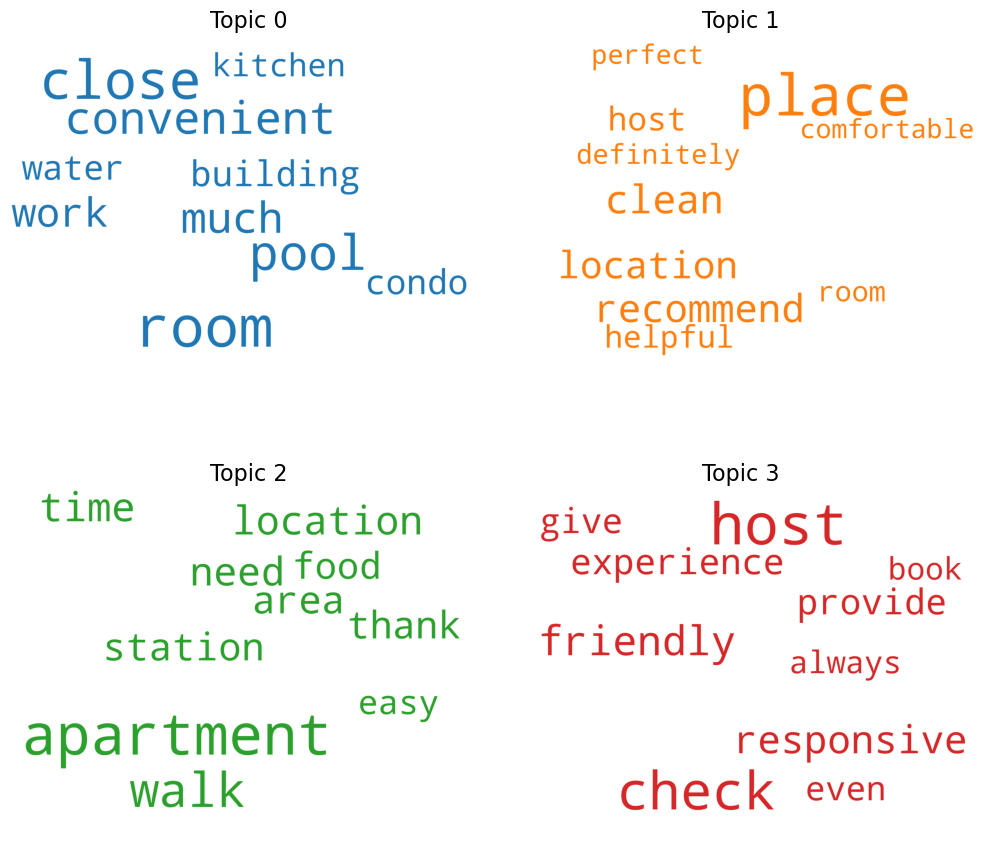

In [58]:
# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stop,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()


/var/folders/tr/y6nybfjj6xxgwrmyj_nbfb5w0000gn/T/ipykernel_50433/2306212337.py:27: UserWarning:

FixedFormatter should only be used together with FixedLocator



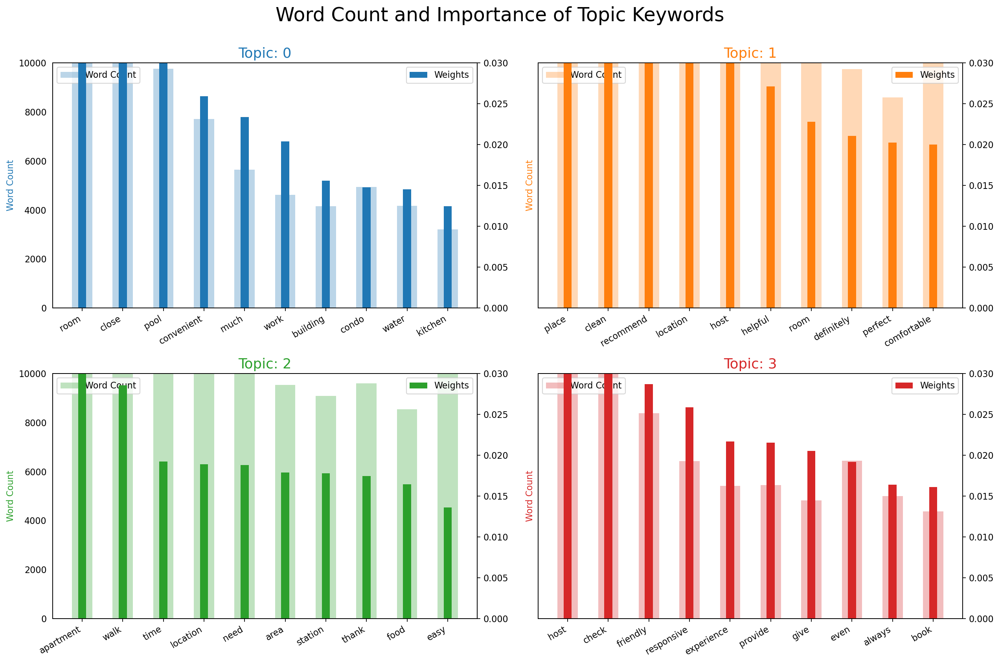

In [59]:

#I want to find the most common words in each topic 30 words in each topic 

from collections import Counter

topics = lda_model.show_topics(formatted=False)
data_flat = [w for w_list in data_words for w in w_list]
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])
        
df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(2, 2, figsize=(16,10), sharey=True, dpi=160)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 10000)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')
    
fig.tight_layout(w_pad=2)
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=22, y=1.05)
plt.show()




 



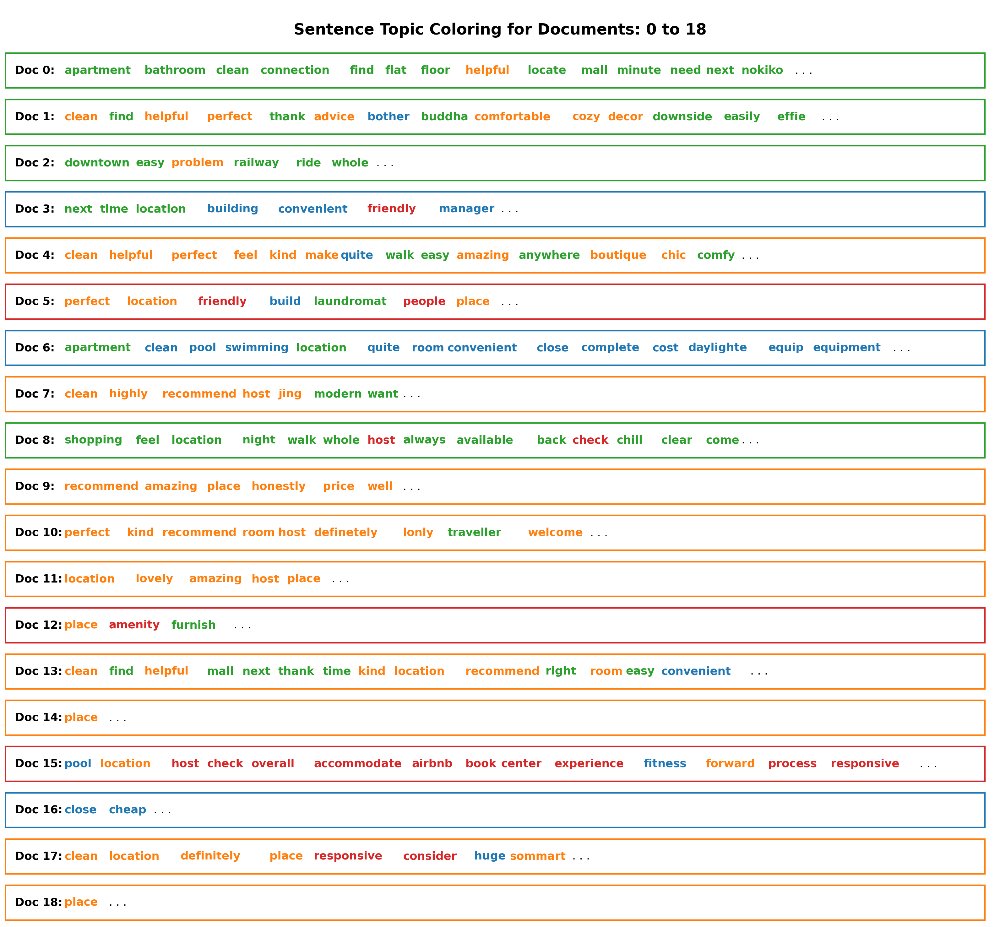

In [60]:
# Sentence Coloring of N Sentences
from matplotlib.patches import Rectangle

def sentences_chart(lda_model=lda_model, corpus=corpus, start = 0, end = 20):
    corp = corpus[start:end]
    mycolors = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    fig, axes = plt.subplots(end-start, 1, figsize=(20, (end-start)*0.95), dpi=160)       
    axes[0].axis('off')
    for i, ax in enumerate(axes):
        if i > 0:
            corp_cur = corp[i-1] 
            topic_percs, wordid_topics, wordid_phivalues = lda_model[corp_cur]
            word_dominanttopic = [(lda_model.id2word[wd], topic[0]) for wd, topic in wordid_topics]    
            ax.text(0.01, 0.5, "Doc " + str(i-1) + ": ", verticalalignment='center',
                    fontsize=16, color='black', transform=ax.transAxes, fontweight=700)

            # Draw Rectange
            topic_percs_sorted = sorted(topic_percs, key=lambda x: (x[1]), reverse=True)
            ax.add_patch(Rectangle((0.0, 0.05), 0.99, 0.90, fill=None, alpha=1, 
                                   color=mycolors[topic_percs_sorted[0][0]], linewidth=2))

            word_pos = 0.06
            for j, (word, topics) in enumerate(word_dominanttopic):
                if j < 14:
                    ax.text(word_pos, 0.5, word,
                            horizontalalignment='left',
                            verticalalignment='center',
                            fontsize=16, color=mycolors[topics],
                            transform=ax.transAxes, fontweight=700)
                    word_pos += .009 * len(word)  # to move the word for the next iter
                    ax.axis('off')
            ax.text(word_pos, 0.5, '. . .',
                    horizontalalignment='left',
                    verticalalignment='center',
                    fontsize=16, color='black',
                    transform=ax.transAxes)       

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.suptitle('Sentence Topic Coloring for Documents: ' + str(start) + ' to ' + str(end-2), fontsize=22, y=0.95, fontweight=700)
    plt.tight_layout()
    plt.show()

sentences_chart()  

In [61]:
import pyLDAvis.gensim
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
vis



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.178924 -0.295759       1        1  36.749393
1      0.082407 -0.012890       2        1  27.414016
0     -0.397063 -0.022687       3        1  19.484243
3      0.135731  0.331336       4        1  16.352348, topic_info=              Term          Freq         Total Category  logprob  loglift
112          place  50465.000000  50465.000000  Default  30.0000  30.0000
94            host  28470.000000  28470.000000  Default  29.0000  29.0000
0        apartment  24144.000000  24144.000000  Default  28.0000  28.0000
58       recommend  18538.000000  18538.000000  Default  27.0000  27.0000
133          check  13101.000000  13101.000000  Default  26.0000  26.0000
..             ...           ...           ...      ...      ...      ...
49            make   3438.411557   8085.288155   Topic4  -4.3018   0.9558
374  communication   2499.183605   4100.095862   Topic4  -4.6209   1.3158
143        overall   2266.672779   4621.330958   Topic4  -4.7185   1.0984
72            easy   2605.286754  12712.459399   Topic4  -4.5793   0.2258
310      wonderful   2038.983382   4471.440911   Topic4  -4.8244   1.0255

[177 rows x 6 columns], token_table=      Topic      Freq         Term
term                              
563       4  0.999591         able
168       4  0.999623  accommodate
169       4  0.999636       airbnb
377       4  0.999817      airport
130       1  0.281522       always
...     ...       ...          ...
149       2  0.999864         well
224       3  0.999661         wifi
310       1  0.543896    wonderful
310       4  0.456005    wonderful
509       3  0.999849         work

[163 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 2, 1, 4])